# Challenge 3.1

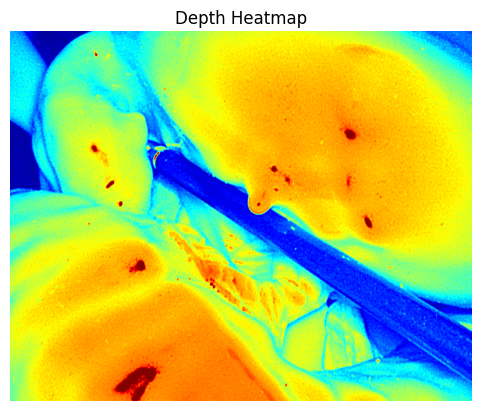

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Beispielhafte Tiefenwerte (0–5000 mm)
depth_map = cv2.imread('../data/zoom_in/screenshot_001.png', cv2.IMREAD_UNCHANGED)  # 16-bit Depth Map

# Normieren auf 8-Bit für Visualisierung
depth_norm = cv2.normalize(depth_map, None, 0, 255, cv2.NORM_MINMAX)
depth_norm = depth_norm.astype(np.uint8)

# In Farbcodierung umwandeln (z. B. Jet)
depth_colored = cv2.applyColorMap(depth_norm, cv2.COLORMAP_JET)

# Anzeigen
plt.imshow(depth_colored[..., ::-1])  # BGR zu RGB
plt.title('Depth Heatmap')
plt.axis('off')
plt.show()


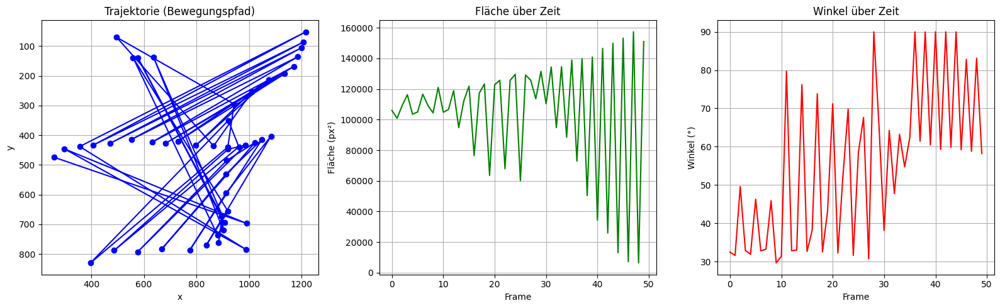

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from glob import glob

# -- Parameter --
image_folder = "../images"  # Dein Bildordner
min_blob_area = 5000     # Schwellenwert für gültige Konturen

# -- Daten sammeln --
trajectory = []
areas = []
angles = []

# -- Bilder sortieren laden --
image_files = sorted(glob(os.path.join(image_folder, "*.png")))

for path in image_files:
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Schwellwert: Dunkles Instrument extrahieren
    _, mask = cv2.threshold(gray, 60, 255, cv2.THRESH_BINARY_INV)

    # Morphologisches Öffnen zur Glättung
    kernel = np.ones((5, 5), np.uint8)
    mask_clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

    # Konturen finden
    contours, _ = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if not contours:
        continue

    # Größte Kontur nehmen
    largest_contour = max(contours, key=cv2.contourArea)
    area = cv2.contourArea(largest_contour)

    if area < min_blob_area:
        continue

    # Schwerpunkt berechnen
    M = cv2.moments(largest_contour)
    cx = int(M['m10'] / (M['m00'] + 1e-5))
    cy = int(M['m01'] / (M['m00'] + 1e-5))
    trajectory.append((cx, cy))
    areas.append(area)

    # Winkel (minAreaRect)
    rect = cv2.minAreaRect(largest_contour)
    angle = rect[2]
    angles.append(angle)

# -- Visualisierung --

# 1. Trajektorie
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
plt.title("Trajektorie (Bewegungspfad)")
traj = np.array(trajectory)
plt.plot(traj[:, 0], traj[:, 1], 'o-', color='blue')
plt.gca().invert_yaxis()
plt.xlabel("x")
plt.ylabel("y")
plt.grid(True)

# 2. Fläche über Zeit (Zoom-Effekt)
plt.subplot(1, 3, 2)
plt.title("Fläche über Zeit")
plt.plot(areas, color='green')
plt.xlabel("Frame")
plt.ylabel("Fläche (px²)")
plt.grid(True)sudo pacman -Syyu blender

plt.subplot(1, 3, 3)
plt.title("Winkel über Zeit")
plt.plot(angles, color='red')
plt.xlabel("Frame")
plt.ylabel("Winkel (°)")
plt.grid(True)

plt.tight_layout()
plt.show()


Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_000.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_000.png] Box center: (1166.0, 517.0), area: 35318.5


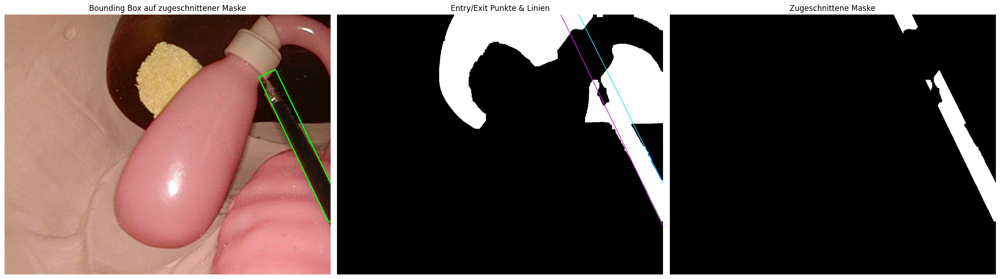

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_001.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_001.png] Box center: (1155.0, 555.0), area: 37264.5


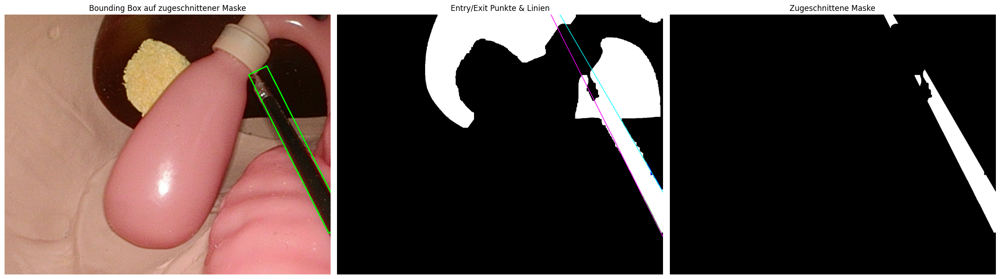

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_002.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_002.png] Box center: (1152.0, 554.0), area: 38248.5


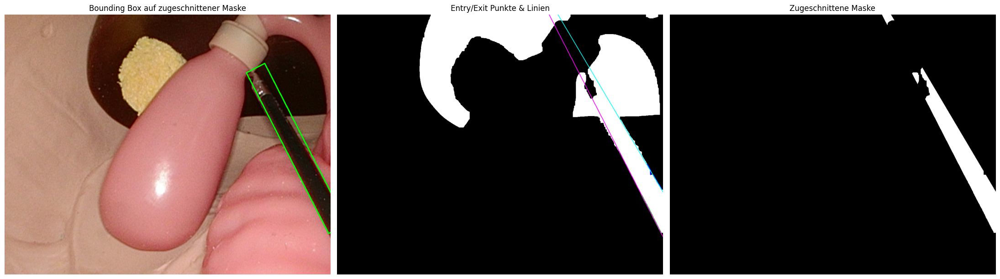

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_003.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_003.png] Box center: (1140.0, 563.0), area: 42078.5


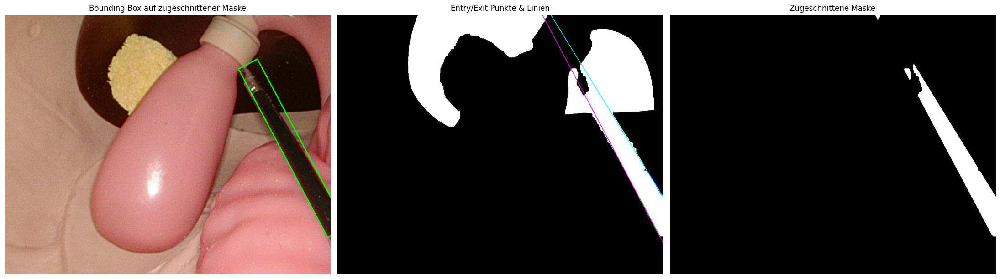

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_004.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_004.png] Box center: (1099.0, 538.0), area: 56514.0


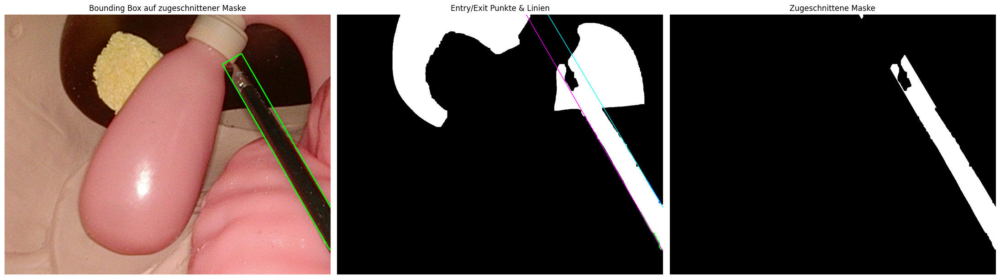

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_005.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_005.png] Box center: (1111.0, 594.0), area: 50086.5


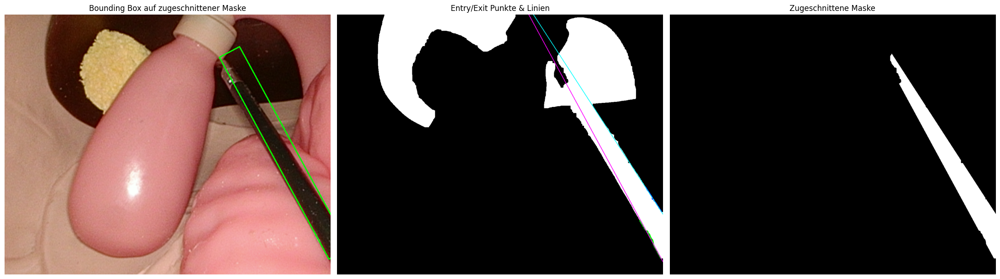

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_006.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_006.png] Box center: (1108.0, 643.0), area: 51116.5


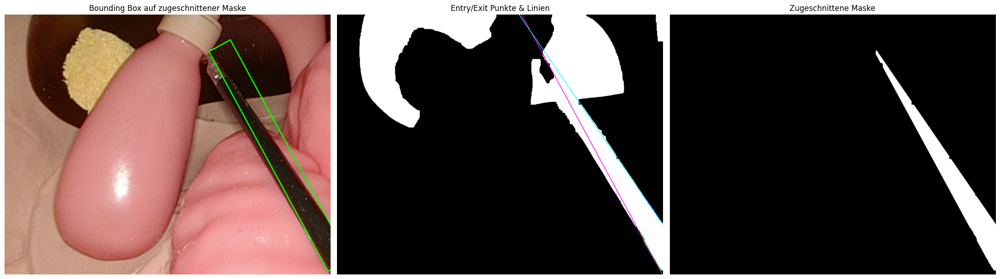

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_007.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_007.png] Box center: (1074.0, 624.0), area: 64618.0


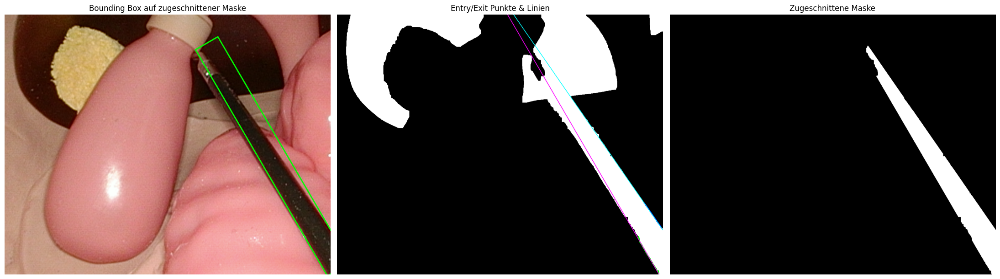

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_008.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_008.png] Box center: (1033.0, 621.0), area: 78903.5


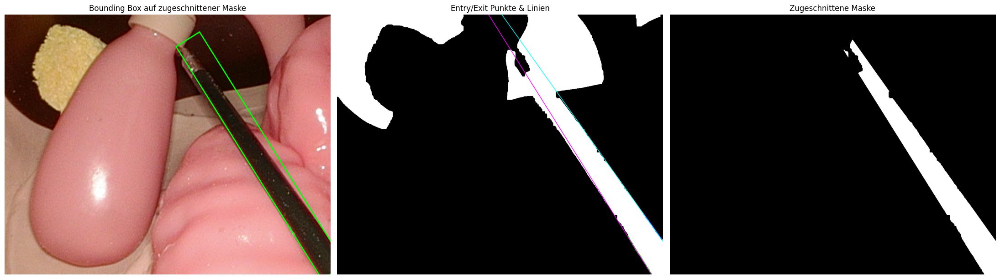

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_009.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_009.png] Box center: (983.0, 627.0), area: 90603.0


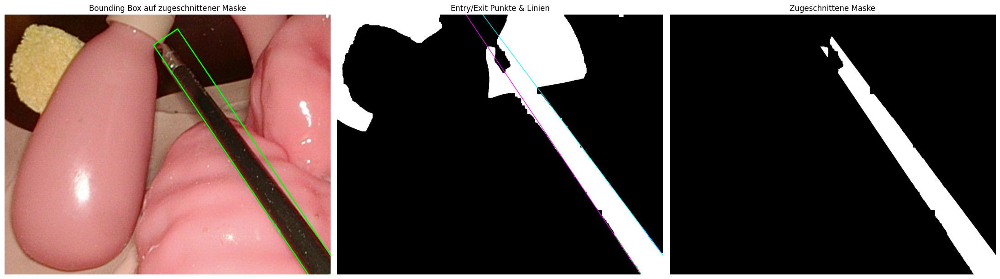

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_010.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_010.png] Box center: (914.0, 625.0), area: 98180.5


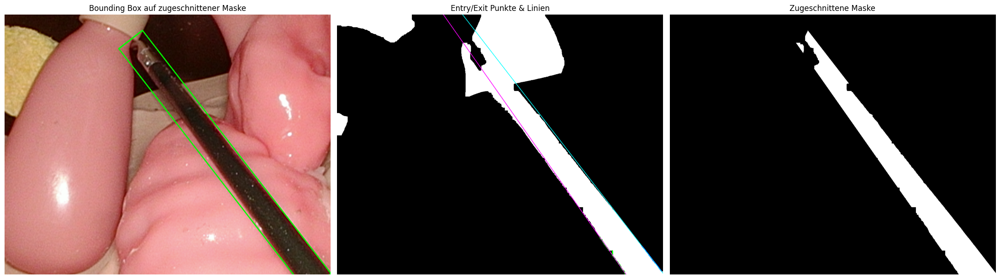

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_011.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_011.png] Box center: (763.0, 418.0), area: 171720.0


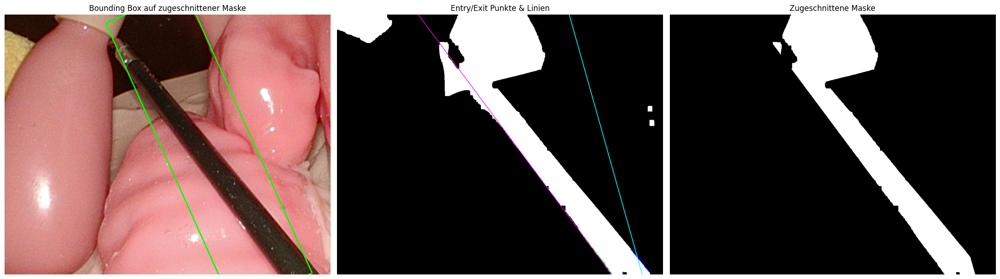

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_012.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_012.png] Box center: (693.0, 415.0), area: 179367.0


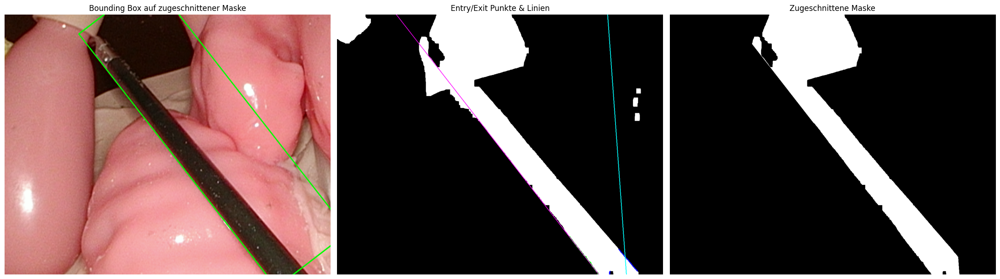

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_013.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_013.png] Box center: (630.0, 417.0), area: 184081.5


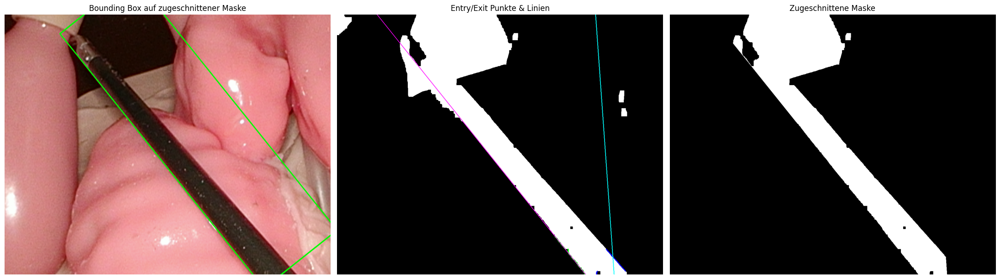

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_014.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_014.png] Box center: (527.0, 413.0), area: 199567.0


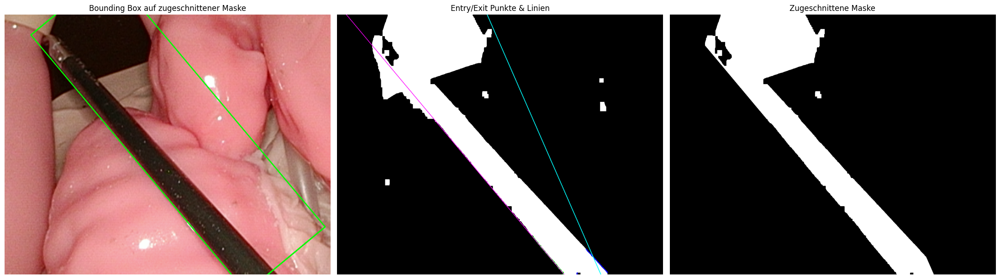

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_015.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_015.png] Box center: (481.0, 595.0), area: 134968.0


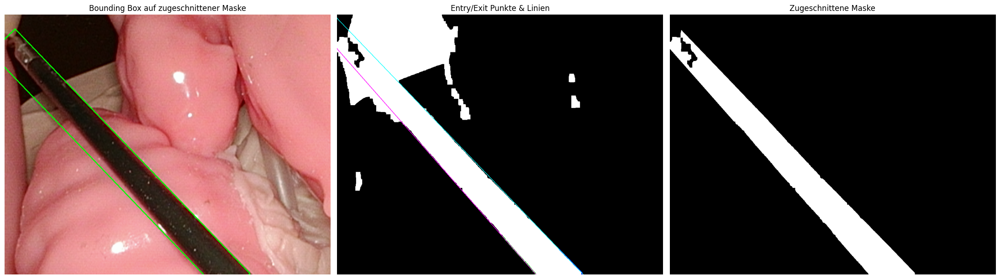

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_016.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_016.png] Box center: (424.0, 639.0), area: 127306.0


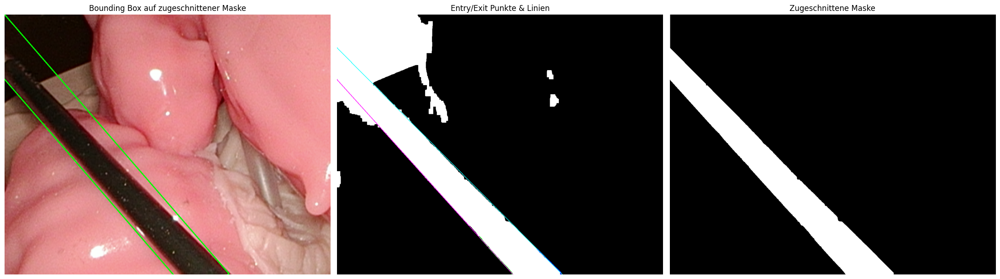

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_017.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_017.png] Box center: (379.0, 682.0), area: 118396.5


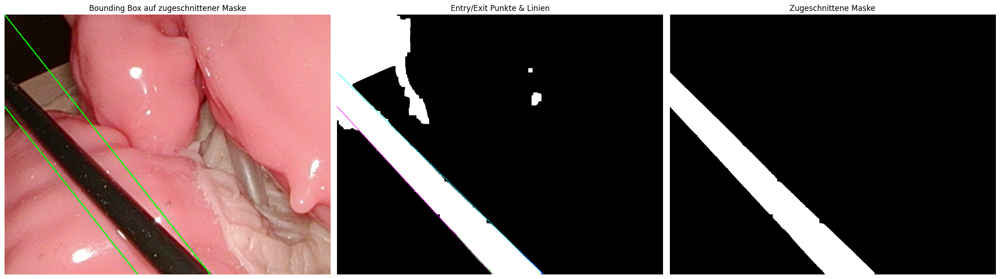

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_018.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_018.png] Box center: (333.0, 736.0), area: 103420.5


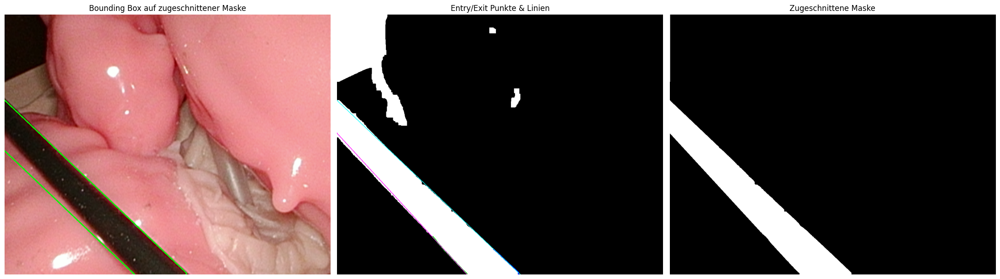

Verarbeite ../images/zoomed_images/zoomed_images/screenshot_zoomed_019.png
[../images/zoomed_images/zoomed_images/screenshot_zoomed_019.png] Box center: (270.0, 789.0), area: 89612.5


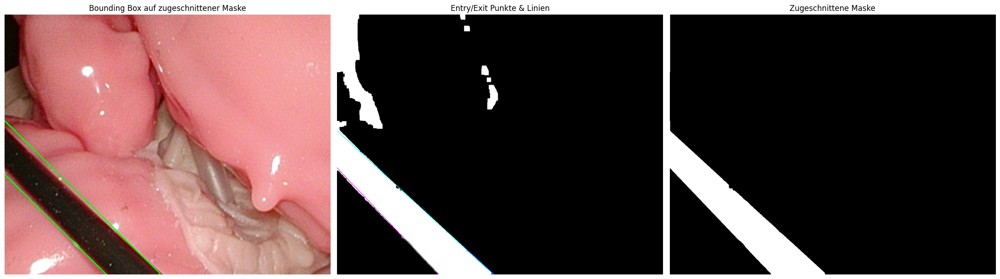

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def fit_line_to_points(y, x):
    if len(x) < 2:
        return None
    coeff = np.polyfit(y, x, 1)  # x = a*y + b
    return coeff

def get_entry_exit_points(mask):
    h, w = mask.shape
    points = []
    # Von unten nach oben (y = h-1 bis 0)
    for y in range(h - 1, -1, -1):
        row = mask[y, :]
        inside_blob = False
        x_entry = None
        x_exit = None

        for x in range(w):
            if not inside_blob and row[x] > 0:  # Eintrittspunkt
                inside_blob = True
                x_entry = x
            elif inside_blob and row[x] == 0:  # Austrittspunkt
                x_exit = x - 1
                break

        if x_entry is not None and x_exit is None:
            # Wenn bis zum rechten Rand drinnen bleibt
            x_exit = w - 1
        if x_entry is not None and x_exit is not None:
            points.append((y, x_entry, x_exit))

    return points

def visualize_entries_and_fit(mask, entries_exits, max_points_entry=150, max_points_exit=100):
    mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)
    width = mask.shape[1]

    # Sortiere nach y von unten nach oben
    sorted_points = sorted(entries_exits, key=lambda tup: -tup[0])

    # Eintrittspunkte - nehme max_points_entry
    top_entries = sorted_points[:max_points_entry]
    y_entry = [y for y, x1, _ in top_entries]
    x_entry = [x1 for y, x1, _ in top_entries]

    # Austrittspunkte filtern: nur x < width-1, dann max_points_exit
    filtered_exit_points = [(y, x2) for y, _, x2 in sorted_points if x2 < width - 1]
    filtered_exit_points = filtered_exit_points[:max_points_exit]

    y_exit = [y for y, x in filtered_exit_points]
    x_exit = [x for y, x in filtered_exit_points]

    # Eintrittspunkte grün zeichnen
    for y, x1 in zip(y_entry, x_entry):
        cv2.circle(mask_rgb, (x1, y), 2, (0, 255, 0), -1)
    # Austrittspunkte rot zeichnen
    for y, x2 in filtered_exit_points:
        cv2.circle(mask_rgb, (x2, y), 2, (0, 0, 255), -1)

    # Linien fitten und zeichnen
    coeff_entry = fit_line_to_points(y_entry, x_entry)
    coeff_exit = fit_line_to_points(y_exit, x_exit)

    h = mask.shape[0]
    y_vals = np.linspace(0, h - 1, h)

    if coeff_entry is not None:
        x_vals = coeff_entry[0] * y_vals + coeff_entry[1]
        for x, y in zip(x_vals, y_vals):
            if 0 <= int(x) < width:
                cv2.circle(mask_rgb, (int(x), int(y)), 1, (255, 0, 255), -1)  # magenta Linie

    if coeff_exit is not None:
        x_vals = coeff_exit[0] * y_vals + coeff_exit[1]
        for x, y in zip(x_vals, y_vals):
            if 0 <= int(x) < width:
                cv2.circle(mask_rgb, (int(x), int(y)), 1, (0, 255, 255), -1)  # cyan Linie

    return mask_rgb, coeff_entry, coeff_exit

def mask_left_of_entry_line_clear(mask, coeff_entry):
    h, w = mask.shape
    y_vals = np.arange(h)
    if coeff_entry is None:
        return mask.copy()
    x_vals = coeff_entry[0] * y_vals + coeff_entry[1]
    mask_cleared = mask.copy()
    for y in range(h):
        x_cutoff = int(x_vals[y])
        if x_cutoff < 0:
            x_cutoff = 0
        if x_cutoff >= w:
            x_cutoff = w - 1
        # Alles links von x_cutoff löschen
        mask_cleared[y, :x_cutoff] = 0
    return mask_cleared

def mask_right_of_exit_line_clear(mask, coeff_exit):
    h, w = mask.shape
    y_vals = np.arange(h)
    if coeff_exit is None:
        return mask.copy()
    x_vals = coeff_exit[0] * y_vals + coeff_exit[1]
    mask_cleared = mask.copy()
    for y in range(h):
        x_cutoff = int(x_vals[y])
        if x_cutoff < 0:
            x_cutoff = 0
        if x_cutoff >= w:
            x_cutoff = w - 1
        # Alles rechts von x_cutoff löschen
        mask_cleared[y, x_cutoff+1:] = 0
    return mask_cleared

def detect_black_object_and_draw_box(image_path):
    # Bild laden
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Threshold auf dunkle Bereiche (z.B. schwarzer Schlauch)
    _, thresh = cv2.threshold(gray, 80, 255, cv2.THRESH_BINARY_INV)

    # Morphologische Operationen zur Verbesserung
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9, 9))
    clean = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    clean = cv2.morphologyEx(clean, cv2.MORPH_CLOSE, kernel, iterations=1)  # Closing

    # Eintritts- und Austrittspunkte ermitteln
    entries_exits = get_entry_exit_points(clean)

    # Linien fitten und visualisieren
    result_with_lines, coeff_entry, coeff_exit = visualize_entries_and_fit(clean, entries_exits)

    # Maske links von Eintrittslinie und rechts von Austrittslinie beschneiden
    clean_mask_cropped = mask_left_of_entry_line_clear(clean, coeff_entry)
    clean_mask_cropped = mask_right_of_exit_line_clear(clean_mask_cropped, coeff_exit)

    # Rechteckige Bounding Box auf zugeschnittener Maske bestimmen
    contours, _ = cv2.findContours(clean_mask_cropped, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    h, w = clean_mask_cropped.shape
    top = int(0.20 * h)
    bottom = int(0.80 * h)

    result = image_rgb.copy()

    for cnt in contours:
        M = cv2.moments(cnt)
        if M["m00"] == 0:
            continue
        cx = int(M["m10"] / M["m00"])
        cy = int(M["m01"] / M["m00"])

        # Filtere nur Konturen mit Schwerpunkt im mittleren 60% Bereich
        if cy < top or cy > bottom:
            continue

        area = cv2.contourArea(cnt)
        if area > 1000:
            rect = cv2.minAreaRect(cnt)
            box = cv2.boxPoints(rect)
            box = np.intp(box)
            cv2.drawContours(result, [box], 0, (0, 255, 0), 3)
            print(f"[{image_path}] Box center: ({cx:.1f}, {cy:.1f}), area: {area:.1f}")

    # Visualisierung
    fig, axs = plt.subplots(1, 3, figsize=(22, 7))
    axs[0].imshow(result)
    axs[0].set_title("Bounding Box auf zugeschnittener Maske")
    axs[0].axis('off')

    axs[1].imshow(result_with_lines)
    axs[1].set_title("Entry/Exit Punkte & Linien")
    axs[1].axis('off')

    axs[2].imshow(clean_mask_cropped, cmap='gray')
    axs[2].set_title("Zugeschnittene Maske")
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()

# Beispielaufrufe
for i in range(20):
    filename = f'../images/zoomed_images/zoomed_images/screenshot_zoomed_{i:03d}.png'
    print(f"Verarbeite {filename}")
    detect_black_object_and_draw_box(filename)